In [1]:
import pystac_client
import pystac
import odc.stac
import xarray 
import rioxarray
import planetary_computer
import pathlib
import pandas
import numpy
import folium
import dask.distributed
import branca.element, branca.colormap # Remove whitespace around small folium map

In [2]:
def geopandas_bounds_to_plot(dataframe, crs=4326):
    """ Changing bounding box representation to leaflet notation ``(lon1, lat1, lon2, lat2) -> ((lat1, lon1), (lat2, lon2))`` """
    x1, y1, x2, y2 = dataframe.to_crs(crs).total_bounds
    return ((y1, x1), (y2, x2))

In [3]:
def update_raster_defaults(raster):
    for key in raster.data_vars:
        if key == "SCL":
            continue
        raster[key].rio.write_crs(raster[key].rio.crs, inplace=True)
        raster[key].rio.write_nodata(numpy.nan, encoded=True, inplace=True);

# Dask for performance

In [4]:
client = dask.distributed.Client()
odc.stac.configure_rio(cloud_defaults=True, client=client)
display(client)

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 4
Total threads: 8,Total memory: 31.73 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:51015,Workers: 4
Dashboard: http://127.0.0.1:8787/status,Total threads: 8
Started: Just now,Total memory: 31.73 GiB
Comm: tcp://127.0.0.1:51030,Total threads: 2
Dashboard: http://127.0.0.1:51033/status,Memory: 7.93 GiB
Nanny: tcp://127.0.0.1:51018,


# Path setup for data within the repository

In [5]:
data_path = pathlib.Path.cwd() / ".." / "data"
(data_path / "rasters").mkdir(parents=True, exist_ok=True)
crs_wsg = 4326
crs = 2193
name = "waikouaiti"

# Earth Search STAC band names
* information on Planetary Computer Catalogue - https://stacindex.org/catalogs/microsoft-pc#/
* Information on the Copernicus DEM's - https://object.cloud.sdsc.edu/v1/AUTH_opentopography/www/metadata/Copernicus_metadata.pdf
* Good example notebook working with Copernicus Planteary Computer DEM [link](https://github.com/microsoft/PlanetaryComputerExamples/blob/main/datasets/copernicus-dem/copernicus-dem-example.ipynb)

In [7]:
catalogue = {"url": "https://planetarycomputer.microsoft.com/api/stac/v1",
             "collections": {"sentinel": "sentinel-2-l2a", "dem": "cop-dem-glo-30"}}
bands = ["red", "green", "blue", "nir", "SCL", "swir16", "B05", "B8A"] # Band 05 - Vegetation red edge 1, Band 8A - Vegetation red edge 4
raster_defaults = {"resolution": 10, "nodata": 0, "dtype": "uint16"}

In [8]:
# use publically available stac link such as
odc.stac.configure_rio(cloud_defaults=True, aws={"aws_unsigned": True})
client = pystac_client.Client.open(catalogue["url"], modifier=planetary_computer.sign_inplace) 

# Geometry of AOI
import geopandas
geometry_df = geopandas.read_file(data_path / "vectors" / f"{name}.gpkg")
geometry = geometry_df.to_crs(crs_wsg).iloc[0].geometry
land = geopandas.read_file(data_path / "vectors" / f"main_islands.gpkg")

# Query for the data

In [9]:
date_YYMM = "2020-05-31"
filters = {"eo:cloud_cover":{"lt":10}}
search_sentinel = client.search(
    collections=[catalogue["collections"]["sentinel"]], intersects=geometry, datetime=date_YYMM, query=filters
) 
search_dem = client.search(collections=[catalogue["collections"]["dem"]], intersects=geometry) 

pandas.DataFrame.from_records(search_sentinel.item_collection_as_dict()['features'])

,id,bbox,type,links,assets,geometry,collection,properties,stac_extensions,stac_version
0,S2A_MSIL2A_20200531T223721_R072_T59GMK_2020091...,"[169.70489273664208, -46.139752512926016, 171....",Feature,"[{'rel': 'collection', 'type': 'application/js...",{'AOT': {'href': 'https://sentinel2l2a01.blob....,"{'type': 'Polygon', 'coordinates': [[[171.1178...",sentinel-2-l2a,"{'datetime': '2020-05-31T22:37:21.024000Z', 'p...",[https://stac-extensions.github.io/eo/v1.0.0/s...,1.0.0


# Information about the catalogues

In [ ]:
collections = list(client.get_collections())
print(f"Number of collections: {len(collections)}")
print("Collections IDs:")
for collection in collections:
    if "dem" in collection.id.lower():
        print(f"- {collection.id}")

In [ ]:
search_dem.item_collection()

In [ ]:
search_sentinel.item_collection()

## Download and constuct Kelp layer

In [10]:
data = odc.stac.load(search_sentinel.items(), geopolygon=geometry, bands=bands, chunks={}, groupby="solar_day",
                  resolution = raster_defaults["resolution"], dtype=raster_defaults["dtype"], nodata=raster_defaults["nodata"],
                  patch_url=planetary_computer.sign)

In [11]:
data.to_netcdf(data_path / "rasters" / "test" / f'un_scaled_and_offset_int.nc', format="NETCDF4", engine="netcdf4")

## Call below if you want to load a DEM
Currently DEM is not used

In [ ]:
signed_asset = planetary_computer.sign(list(search_dem.items())[0].assets["data"])
dem = rioxarray.open_rasterio(signed_asset.href).squeeze().drop_vars("band")
dem.to_netcdf(r"C:\Local\repos\kelp-detection\data\rasters\dem.nc")

### Remove any dates with no valid data

In [12]:
data["SCL"].load()
data["SCL"] = data["SCL"].rio.clip(land.to_crs(data["SCL"].rio.crs).geometry.values, invert=True)
data["SCL"].rio.write_crs(data["SCL"].rio.crs, inplace=True);
data.isel(time=(data["SCL"] != 0).any(dim=["x", "y"])); # 0 == no SCL data

## Caclulate kelp for remaining dates
* Convert bands to floats
* Caclulate derived indices
* Mask out non-kelp areas

In [13]:
for band in bands: 
    if band == "SCL": 
        continue
    data[band] = data[band].astype("float32").where(data[band] != 0, numpy.nan)
update_raster_defaults(data)

In [14]:
data["ndvi"] = (data.nir - data.red) / (data.nir + data.red)
data["ndwi"] = (data.green-data.nir)/(data.green+data.nir)
data["ndvri"] = (data.B05-data.red)/(data.B05+data.red);
data["ndwi2"] = (data.swir16-data.B05)/(data.swir16+data.B05);
update_raster_defaults(data)

In [ ]:
data.to_netcdf(data_path / "rasters" / f'all_bands_test.nc', format="NETCDF4", engine="netcdf4")

In [15]:
land = geopandas.read_file(data_path / "vectors" / "main_islands.geojson")

In [16]:
scl_dict = {"no data": 0, "defective": 1, "cast shadow": 2, "cloud shadow": 3,
            "vegetation": 4, "not vegetated": 5, "water": 6, "unclassified": 7,
            "cloud medium probability": 8, "cloud high probability": 9,
            "thin cirrus": 10, "snow": 11}
thresholds = {"min_ndvi": 0.01, "max_ndvi": 0.7, "max_ndwi": 0.2, "min_ndvri": 0.05}

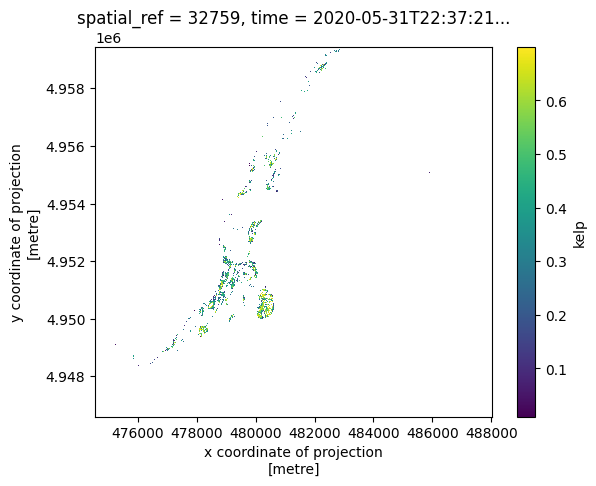

In [22]:
#data["kelp"] = data["kelp"].where(mask, numpy.nan) <= nan set where the mask values are false
data["kelp"] = (data.nir - data.red) / (data.nir + data.red)
data["kelp"] = data["kelp"].where(data["ndvi"].data > thresholds["min_ndvi"], numpy.nan)
data["kelp"] = data["kelp"].where(data["ndvi"].data < thresholds["max_ndvi"], numpy.nan)
data["kelp"] = data["kelp"].where(data["ndwi"].data < thresholds["max_ndwi"], numpy.nan)
data["kelp"] = data["kelp"].where(data["ndvri"].data > thresholds["min_ndvri"], numpy.nan)
data["kelp"] = data["kelp"].rio.clip(land.to_crs(data["kelp"].rio.crs).geometry.values, invert=True)
data["kelp"] = data["kelp"].where(data["SCL"] != scl_dict["cloud high probability"], numpy.nan)
data["kelp"] = data["kelp"].where(data["SCL"] != scl_dict["defective"], numpy.nan)
update_raster_defaults(data)

In [42]:
data["kelp"].to_netcdf(data_path / "rasters" / f'kelp_test.nc', format="NETCDF4", engine="netcdf4")

In [109]:
kelp_display = data["kelp"].isel(time=0)

fig = branca.element.Figure(width='70%', height='50%') # Ensures no extra whitespace below

m = folium.Map()
land.explore(m=m)
kelp_display.odc.add_to(m, opacity=0.75, cmap="inferno", vmin=-1, vmax=1) # viridis
m.fit_bounds(kelp_display.odc.map_bounds())

colormap = branca.colormap.linear.inferno.scale(-1, 1)
colormap.caption = 'Kelp Index'
colormap.add_to(m)

display(m)